<a href="https://colab.research.google.com/github/MarioSigal/Aprendizaje-Automatico/blob/main/Laboratorios/Labo_color_espacio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip -q install astropy scikit-image

In [2]:
import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
from skimage.color import hsv2rgb, rgb2lab

## descargar

In [17]:
import requests

urls = {
    "F770W": "https://archive.stsci.edu/hlsps/jwst-ero/hlsp_jwst-ero_jwst_miri_ngc3132_f770w_v1_i2d.fits",
    "F1130W": "https://archive.stsci.edu/hlsps/jwst-ero/hlsp_jwst-ero_jwst_miri_ngc3132_f1130w_v1_i2d.fits",
    "F1280W": "https://archive.stsci.edu/hlsps/jwst-ero/hlsp_jwst-ero_jwst_miri_ngc3132_f1280w_v1_i2d.fits",
    "F1800W": "https://archive.stsci.edu/hlsps/jwst-ero/hlsp_jwst-ero_jwst_miri_ngc3132_f1800w_v1_i2d.fits"
}

for nombre, url in urls.items():

    respuesta = requests.get(url)
    respuesta.raise_for_status()

    with open(nombre + ".fits", "wb") as archivo:
        archivo.write(respuesta.content)

    print("✓ Descargado:", nombre)

✓ Descargado: F770W
✓ Descargado: F1130W
✓ Descargado: F1280W
✓ Descargado: F1800W


In [18]:
F770W = fits.open("F770W.fits")["SCI"].data
F1130W = fits.open("F1130W.fits")["SCI"].data
F1280W = fits.open("F1280W.fits")["SCI"].data
F1800W = fits.open("F1800W.fits")["SCI"].data

In [19]:
print(F770W.shape)
print(F770W.dtype)

(1173, 1749)
>f4


## Visualización

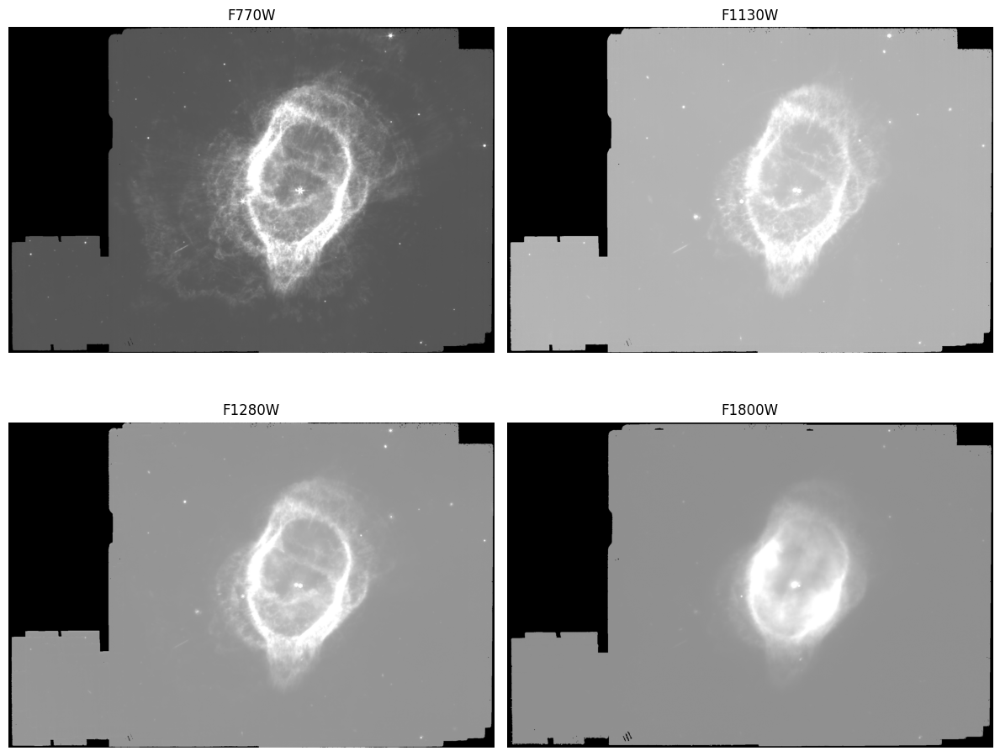

In [46]:
imagenes = [
    ("F770W", F770W),
    ("F1130W", F1130W),
    ("F1280W", F1280W),
    ("F1800W", F1800W)
]

fig, ax = plt.subplots(2, 2, figsize=(12, 10))

for eje, (nombre, imagen) in zip(ax.ravel(), imagenes):

    eje.imshow(
        imagen,
        cmap="gray",
        vmin=np.nanpercentile(imagen, 1),
        vmax=np.nanpercentile(imagen, 99)
    )

    eje.set_title(nombre)
    eje.axis("off")

plt.tight_layout()
plt.show()

In [33]:
def normalizar(img, pmin=1, pmax=99):
    """
    Lleva una imagen al rango [0,1]
    usando percentiles para controlar outliers.
    """

    img = img.astype(float)

    minimo = np.nanpercentile(img, pmin)
    maximo = np.nanpercentile(img, pmax)

    img = (img - minimo) / (maximo - minimo)

    return np.clip(img, 0, 1)

In [47]:
imagenes = {
    "F770W": F770W,
    "F1130W": F1130W,
    "F1280W": F1280W,
    "F1800W": F1800W
}
def mostrar_rgb(rojo, verde, azul, titulo="RGB"):

    rgb = np.stack([
        normalizar(imagenes[rojo]),
        normalizar(imagenes[verde]),
        normalizar(imagenes[azul])
    ], axis=-1)

    plt.figure(figsize=(10, 10))
    plt.imshow(rgb)
    plt.axis("off")
    plt.title(
        f"{titulo}\n"
        f"R={rojo}  G={verde}  B={azul}"
    )
    plt.show()

    return rgb

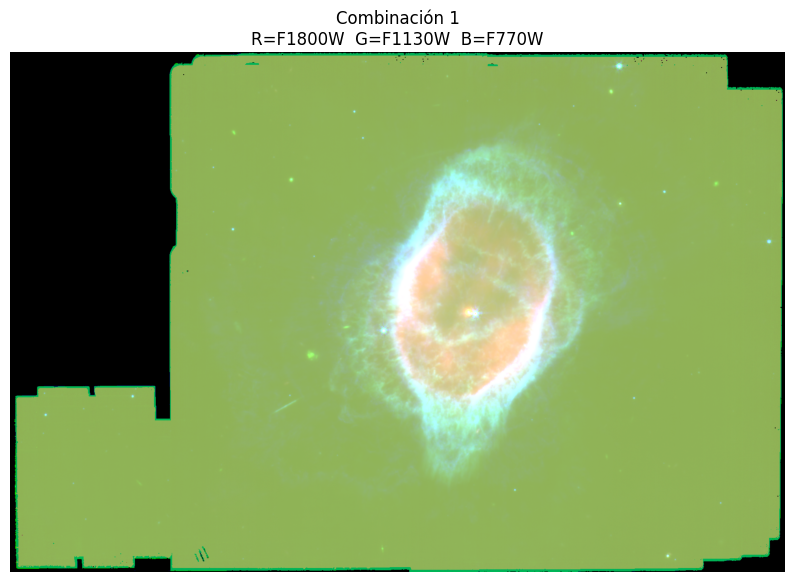

In [48]:
rgb1 = mostrar_rgb(
    "F1800W",
    "F1130W",
    "F770W",
    "Combinación 1"
)

[('F770W', 'F1130W', 'F1280W'), ('F770W', 'F1130W', 'F1800W'), ('F770W', 'F1280W', 'F1130W'), ('F770W', 'F1280W', 'F1800W'), ('F770W', 'F1800W', 'F1130W'), ('F770W', 'F1800W', 'F1280W'), ('F1130W', 'F770W', 'F1280W'), ('F1130W', 'F770W', 'F1800W'), ('F1130W', 'F1280W', 'F770W'), ('F1130W', 'F1280W', 'F1800W'), ('F1130W', 'F1800W', 'F770W'), ('F1130W', 'F1800W', 'F1280W'), ('F1280W', 'F770W', 'F1130W'), ('F1280W', 'F770W', 'F1800W'), ('F1280W', 'F1130W', 'F770W'), ('F1280W', 'F1130W', 'F1800W'), ('F1280W', 'F1800W', 'F770W'), ('F1280W', 'F1800W', 'F1130W'), ('F1800W', 'F770W', 'F1130W'), ('F1800W', 'F770W', 'F1280W'), ('F1800W', 'F1130W', 'F770W'), ('F1800W', 'F1130W', 'F1280W'), ('F1800W', 'F1280W', 'F770W'), ('F1800W', 'F1280W', 'F1130W')]


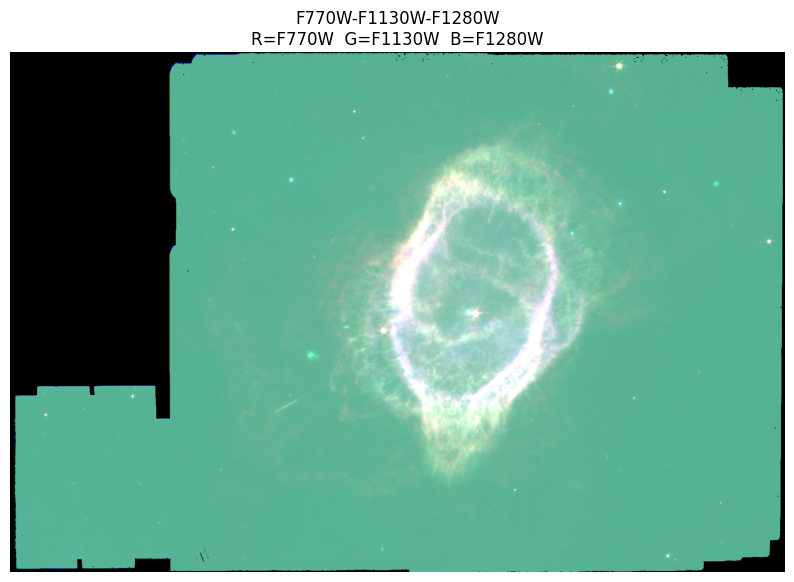

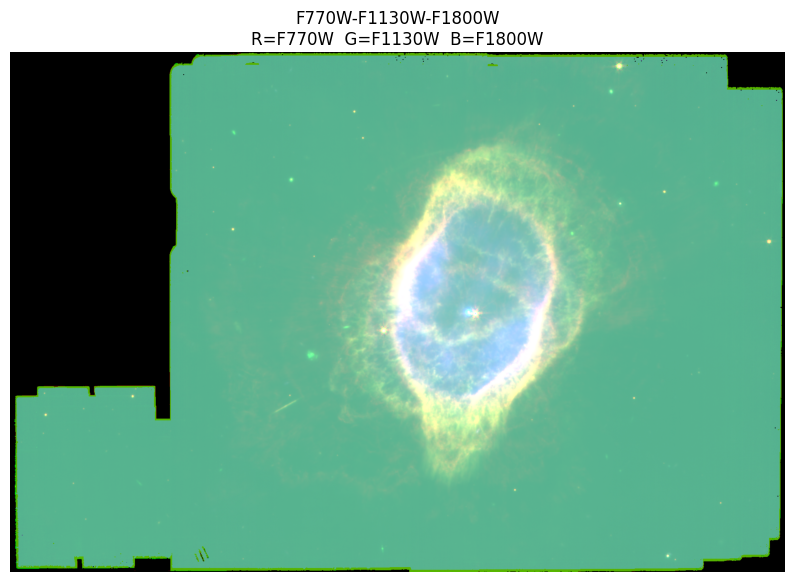

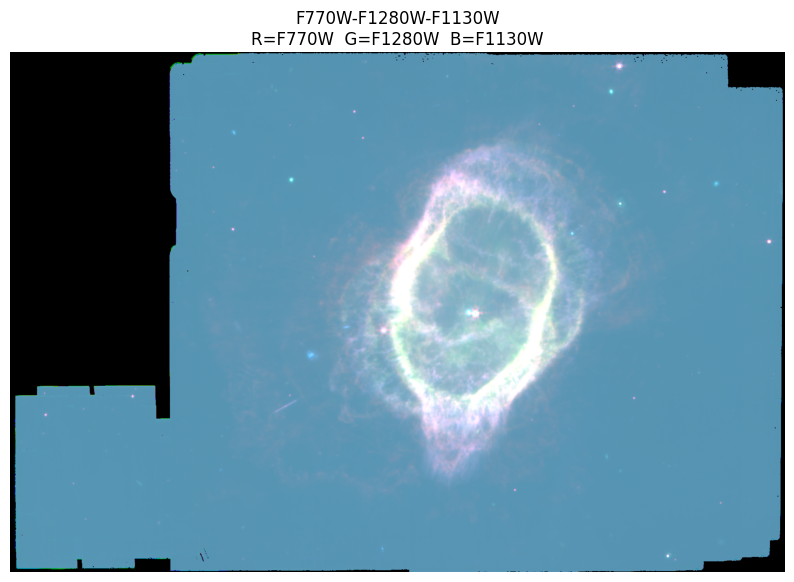

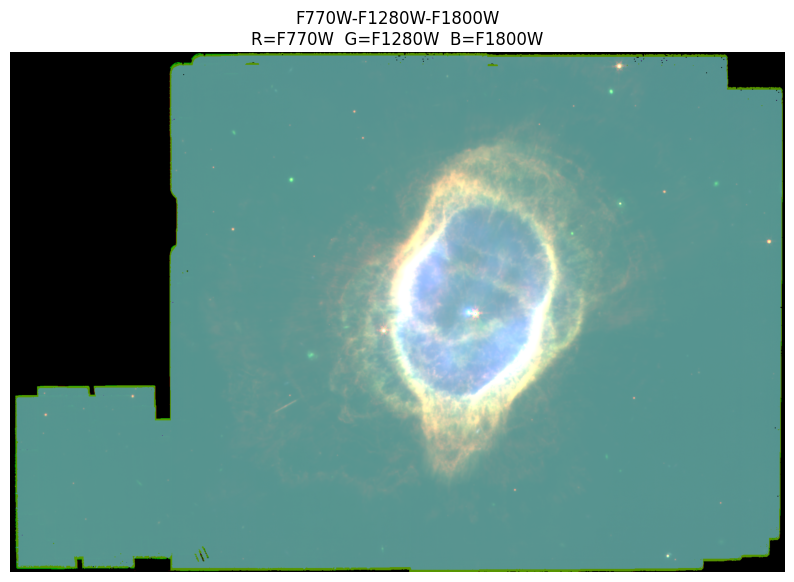

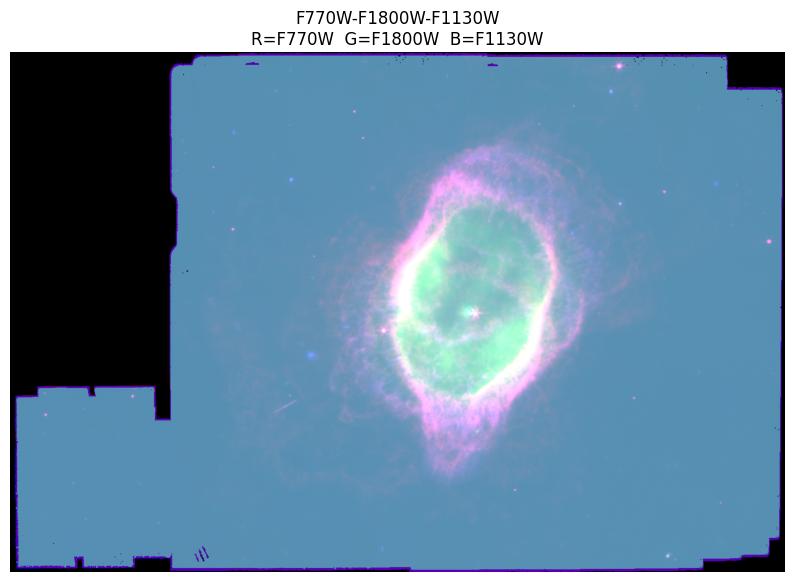

...

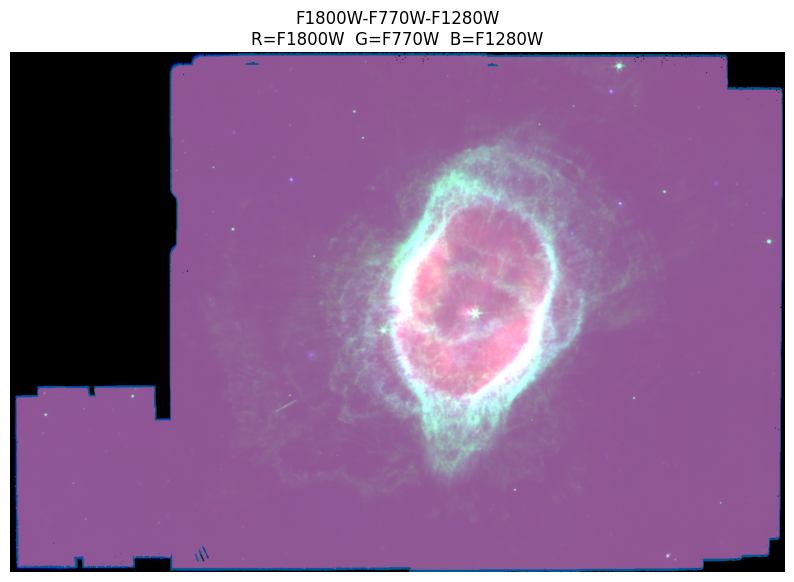

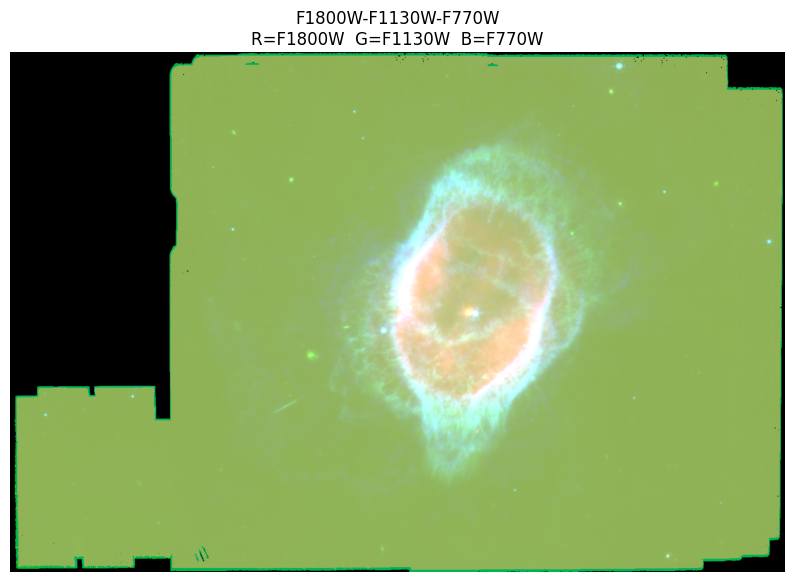

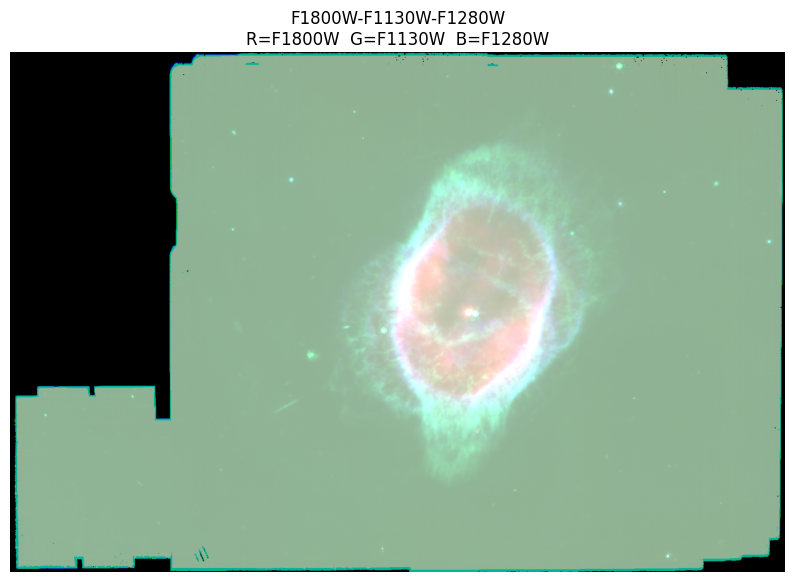

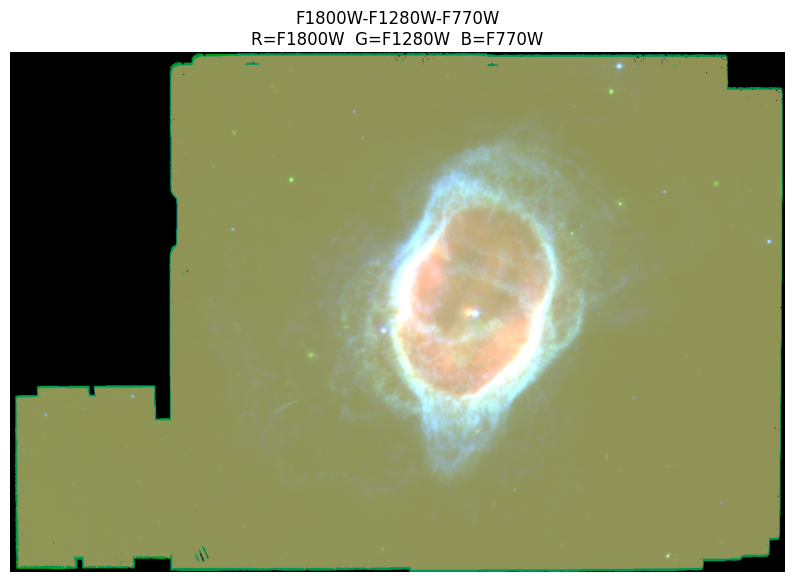

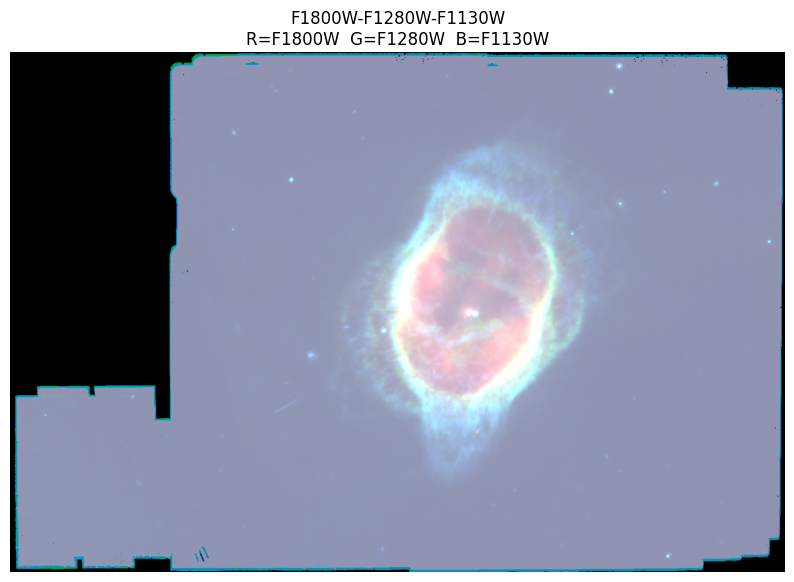

In [55]:
import itertools
combinaciones = list(itertools.permutations(imagenes.keys(), 3))
print(combinaciones)
for (rojo, verde, azul) in combinaciones:
    mostrar_rgb(rojo, verde, azul, f"{rojo}-{verde}-{azul}")